# AI in Medicine II - SuSe 2024
Graded Assignment No.4
# Group members
Muhammed Elmasry (03786399)

Evangelos Fragkiadakis (03786480)

# Introduction

In this exercise, you will get introduced to the world of MRI reconstruction. We start with examining the raw k-space data and coil-sensitivity maps and build the multi-coil forward and adjoint operator. Additionally, we solve a linear and a regularized reconstruction problem, which allows us to deeply understand where we can later connect to machine learning.

First, we install the dependencies and download the data.

In [1]:
# install dependencies
!pip install PyWavelets git+https://github.com/khammernik/medutils.git

  Cloning https://github.com/khammernik/medutils.git to /tmp/pip-req-build-xelreu7i
  Running command git clone --filter=blob:none --quiet https://github.com/khammernik/medutils.git /tmp/pip-req-build-xelreu7i
  Resolved https://github.com/khammernik/medutils.git to commit 634b38effdcc5e88ce3db4ac9441018aa0347e84
  Preparing metadata (setup.py) ... done
  Created wheel for medutils-mri: filename=medutils_mri-0.1.1-py3-none-any.whl size=35421 sha256=cc94bd69c7e19d72ff331537a017d9857b98dc9c1394933b7346751af91d01fb
  Stored in directory: /tmp/pip-ephem-wheel-cache-t7cpt37s/wheels/e4/ce/5b/2367b51148cac4a7fe68fad6a9bb17fe21de9199ce721385ea
Successfully built medutils-mri


In [2]:
# download data
!wget -O brain_cartesian_2D.h5 https://www.dropbox.com/s/hclfv3re91qb1v3/brain_cartesian_2D.h5?dl=1


--2024-07-05 10:22:22--  https://www.dropbox.com/s/hclfv3re91qb1v3/brain_cartesian_2D.h5?dl=1
Resolving www.dropbox.com (www.dropbox.com)... 162.125.81.18, 2620:100:6057:18::a27d:d12
Connecting to www.dropbox.com (www.dropbox.com)|162.125.81.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://www.dropbox.com/scl/fi/lmm7sh2qhyldahhp91eml/brain_cartesian_2D.h5?rlkey=zkbpxft7gd3cknzxl17pgu2wo&dl=1 [following]
--2024-07-05 10:22:22--  https://www.dropbox.com/scl/fi/lmm7sh2qhyldahhp91eml/brain_cartesian_2D.h5?rlkey=zkbpxft7gd3cknzxl17pgu2wo&dl=1
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc8f551be909993f6be2005b9ee6.dl.dropboxusercontent.com/cd/0/inline/CWFDILpYzmMZF7-gtUaI1yMAdFj8zeqjnZ0tICZEzKp0uUYys9TfX-hqwy3Ulqye0ygoKUiWqnQtKiXyTBDUthK3sKilvevjLO4dTa9eCPKyf99hO1NsI_GO0o-X-aY7sBw/file?dl=1# [following]
--2024-07-05 10:22:23--  https://uc8f551be909993f6be2005b9ee6.dl.dropboxu

In [3]:
# Download ESPIRiT code for coil sensitivity map estimation
!git clone https://github.com/mikgroup/espirit-python.git
!cp /content/espirit-python/espirit.py .

Cloning into 'espirit-python'...
remote: Enumerating objects: 17, done.
remote: Total 17 (delta 0), reused 0 (delta 0), pack-reused 17
Receiving objects: 100% (17/17), 4.69 MiB | 5.25 MiB/s, done.
Resolving deltas: 100% (4/4), done.


# Magnetic Resonance Image (MRI) Reconstruction

The goal is to recover the clean image $x$, which is obtained by undersampled k-space data $y$ and corrupted by additive Gaussian white noise $n$,
$$ y = Ax + n. $$
The rawdata $y$ was aquired for multiple receive coils. The linear operator $A$ denotes the mapping from image space to k-space.


## Data Loading

In the first step, we examine the avaiable data regarding their shape and their datatype. Note, that we are dealing with complex-valued data here.

In [4]:
import h5py
import numpy as np
import medutils
np.random.seed(1001)

ds = h5py.File('./brain_cartesian_2D.h5', 'r')
kspace = ds['kspace'][()]
ds.close()

print(f'K-Space:')
print(f'dtype={kspace.dtype}')
print(f'(nCoils, nFE, nPE)={kspace.shape}')
nCoils, nFE, nPE = kspace.shape

BART toolbox not setup properly or not available
K-Space:
dtype=complex64
(nCoils, nFE, nPE)=(16, 640, 330)


We observe that we have 16 coils, the number of frequency encoding (readout) points `nFE` equals 640, and the number of phase encoding steps `nPE` is 330. We will come back to this later.

## Data Visualization
For data visualization, you are free to use any plotting library such as `matplotlib` or use the provided `medutils` package. The `medutils` package has some useful function for visualization:
- `kshow` Process the data in log-space
- `imshow` Display the magnitude of the image
- `plot_array` Re-arrange the images from a 3D array next to each other.
- `ksave` Save k-space
- `imsave` Save images

We will first visualize the `kspace`.

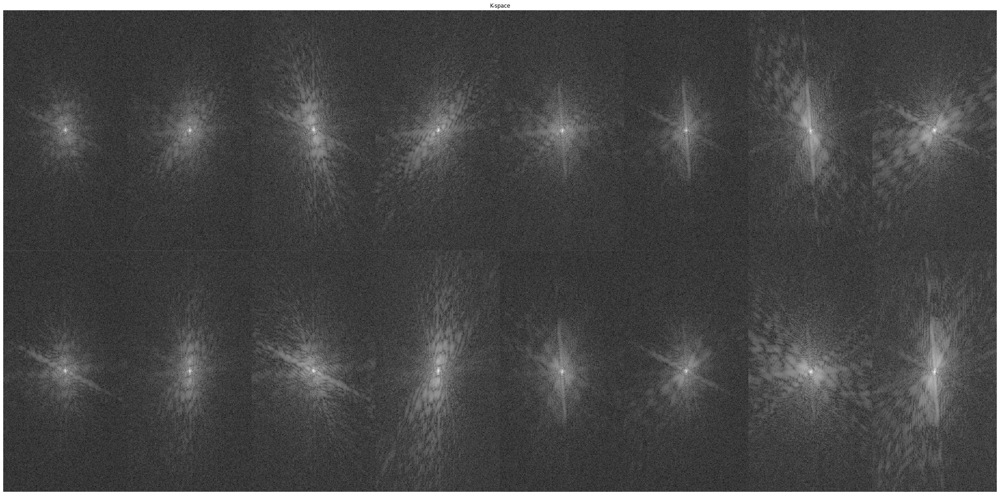

In [5]:
medutils.visualization.kshow(medutils.visualization.plot_array(kspace, M=2, N=8), title='K-space', figsize=(40,20))

## Transforming k-space to image space
Let us now start to transform the `kspace` to images. Therefore, we require the centered 2d inverse Fourier transform. Application of the `ifft2c` to the k-space results in single coil images.

**Task 1: Write the function `ifft2c(kspace)`**
Steps to Implement:

- Step 1: Use np.fft.ifftshift to shift zero-frequency components to the corners.
- Step 2: Apply np.fft.ifft2 for the inverse FFT with norm='ortho'.
- Step 3: Use np.fft.fftshift to shift the result back to center.

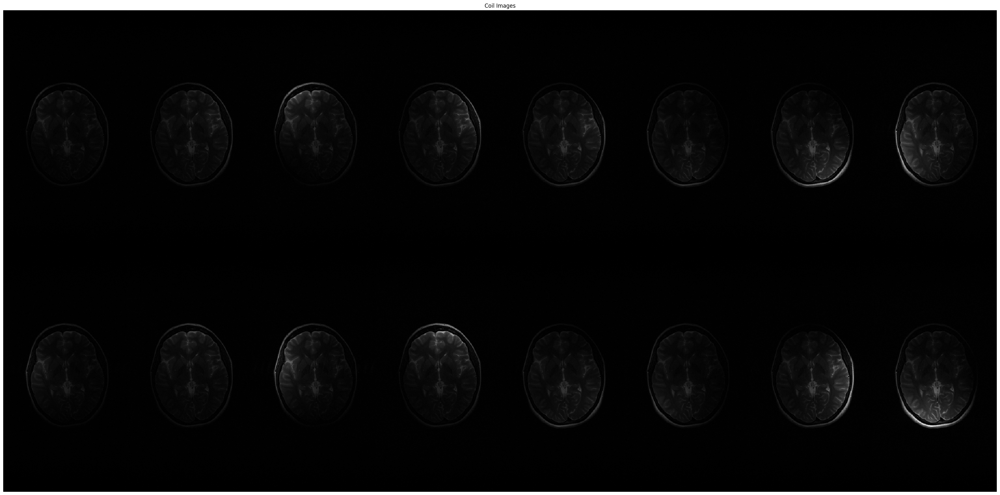

In [6]:
def ifft2c(kspace):
    # Step 1: Use np.fft.ifftshift to shift zero-frequency components to the corners.
    kspace_shifted = np.fft.ifftshift(kspace, axes=(-2, -1))

    # Step 2: Apply np.fft.ifft2 for the inverse FFT with norm='ortho'.
    img = np.fft.ifft2(kspace_shifted, norm='ortho')

    # Step 3: Use np.fft.fftshift to shift the result back to center.
    img_shifted = np.fft.fftshift(img, axes=(-2, -1))

    return img_shifted

coil_img = ifft2c(kspace)
medutils.visualization.imshow(medutils.visualization.plot_array(coil_img, M=2, N=8), title='Coil Images', figsize=(40,20))

You might notice several things. First, you see that only a fraction of the image is bright. This is due to the effect that the coils are sensitive only in a certain spatial region. Second, you might notice that there are a lot of black areas all over the image, especially in y direction. This extended field of view in read-out direction, also termed frequency-encoding direction is actually for free, does not cost any additional acquisition time, and is implemented per default on MRI scanners.  Assuming the base resolution is 320, the number of frequency encoding steps is doubled. This frequency oversampling results in an increased field-of-view in this direction. After the image is transformed to image domain, only the central part needs to be visualized. However, for display, we will from now on only consider the central part.

## Root-Sum-of-Squares Reconstruction

Now, we calculate the Root-Sum-of-Squares reconstruction $x_{rss}$
$$ x_{rss} = \sqrt{ \sum_{c=1}^{nCoils} \vert x_c \vert ^ 2 }, $$

where $x_c$ are the individual coil images. Note that using the root-sum-of-squares reconstruction, the phase information of the complex-valued data gets lost.

We now visualize only the central part of the reconstructed image of size `[nFE//2, nPE]`.

**Task 2: Implement the RSS reconstruction `rss(coil_img)`**

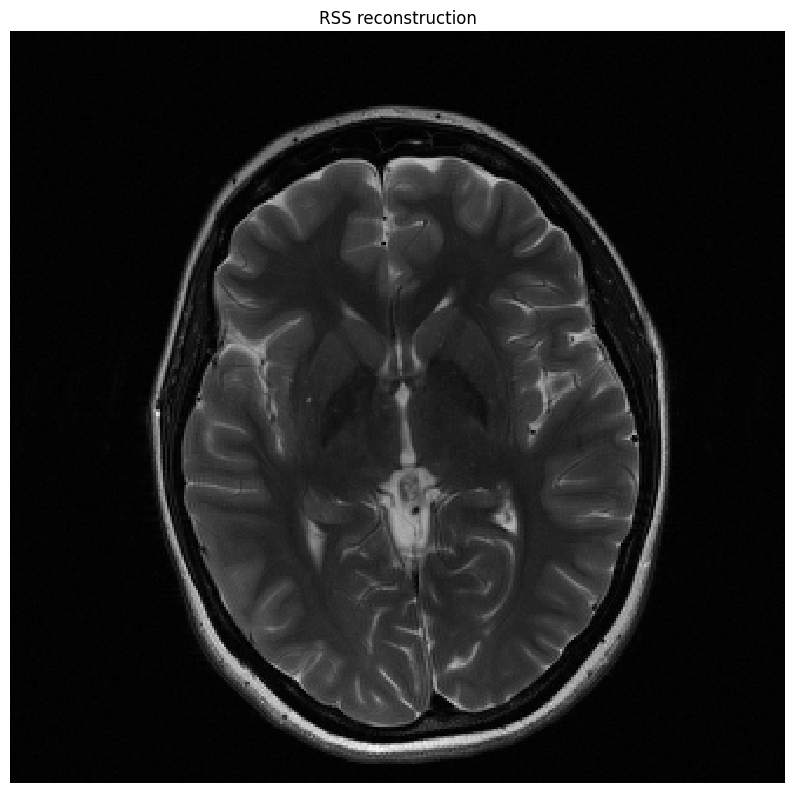

In [7]:
def rss(coil_img):
    # Step 1: Calculate the square of the absolute value of each coil image
    abs_square = np.abs(coil_img) ** 2

    # Step 2: Sum the squared values along the coil dimension
    sum_abs_square = np.sum(abs_square, axis=0)

    # Step 3: Take the square root of the sum
    x_rss = np.sqrt(sum_abs_square)

    return x_rss

x_rss = rss(coil_img)
medutils.visualization.imshow(medutils.visualization.center_crop(x_rss, (nFE//2, nPE)), figsize=(10,10), title='RSS reconstruction')

# Coil Compression using an SVD
The number of receive coils play an important role in accelerated parallel imaging in order to receive high-quality images. However, the larger the number of coils, the more memory the dataset requires and the more computationally expensive the computations are. Coil compression provides a way to reduce the dataset to a smaller number of $P$ virtual coils [1-3]. Let us define the original k-space as $y$, and the compressed k-space as $y_P$. The compressed k-space can be determined by applying a compression matrix $T$ to $y$
$$ y_P = T y. $$
To form our compression matrix $T$, we first apply a pixel-wise SVD to the k-space data,
$$y = USV^\top,$$
where $U$ and $V$ denote the left and right singular vectors and $S$ the diagonal matrix of singular values. To form the compression matrix $T$, we only keep the singular vectors that correspond to the $P$ largest singular values. Hence, the compressed k-space is computed as
$$
y_P = U_p y.
$$


**Task 3: Implement `coil_compression(kspace, svd_cutoff=0.15)`. The parameter `svd_cutoff` defines a threshold for the singular values, i.e., only singular vectors with a corresponding singular value**
$$\frac{\sigma_i}{\sigma_{max}} \geq \text{svd\_cutoff}$$

**should be kept. Compute and print the number of virtual coils and return the reduced k-space $y_p$.**

*Hint: Think about the size of $y$ that should go to the SVD. You do not need to store `full_matrices`. Also think about the matrix sizes for $U$, $S$, and $U_p$. The returned k-space should again have a size of `[nCoils_svd, nFE, nPE]`.*


**Reference**

[1] Huang et al. [A software channel compression technique for faster reconstruction with many channels](https://www.sciencedirect.com/science/article/pii/S0730725X07002731). Magn Reson Imaging 26(1):133-141, 2008.

[2] Buehrer et al. [Array compression for MRI with large coil arrays](https://onlinelibrary.wiley.com/doi/10.1002/mrm.21237). Magn Reson Med 57:1131-1139, 2007.

[3] Zhang et al. [Coil compression for accelerated imaging with Cartesian sampling](https://onlinelibrary.wiley.com/doi/10.1002/mrm.24267). Magn Reson Med 69:571-582, 2013.


In [8]:
def coil_compression(kspace, svd_cutoff=0.15):
    nCoils, nFE, nPE = kspace.shape
    kspace_compressed = np.zeros_like(kspace)

    for i in range(nFE):
        for j in range(nPE):
            y = kspace[:, i, j]
            U, S, Vh = np.linalg.svd(y.reshape(-1, 1), full_matrices=False)
            S_max = np.max(S)
            P = np.sum(S >= svd_cutoff * S_max)
            kspace_compressed[:, i, j] = (U[:, :P] @ np.diag(S[:P]) @ Vh[:P, :]).flatten()

    print(f'Number of virtual coils: {P}')
    return kspace_compressed

kspace = coil_compression(kspace)

Number of virtual coils: 1


Now, we will visualize again the (compressed) coil images and the RSS reconstruction.

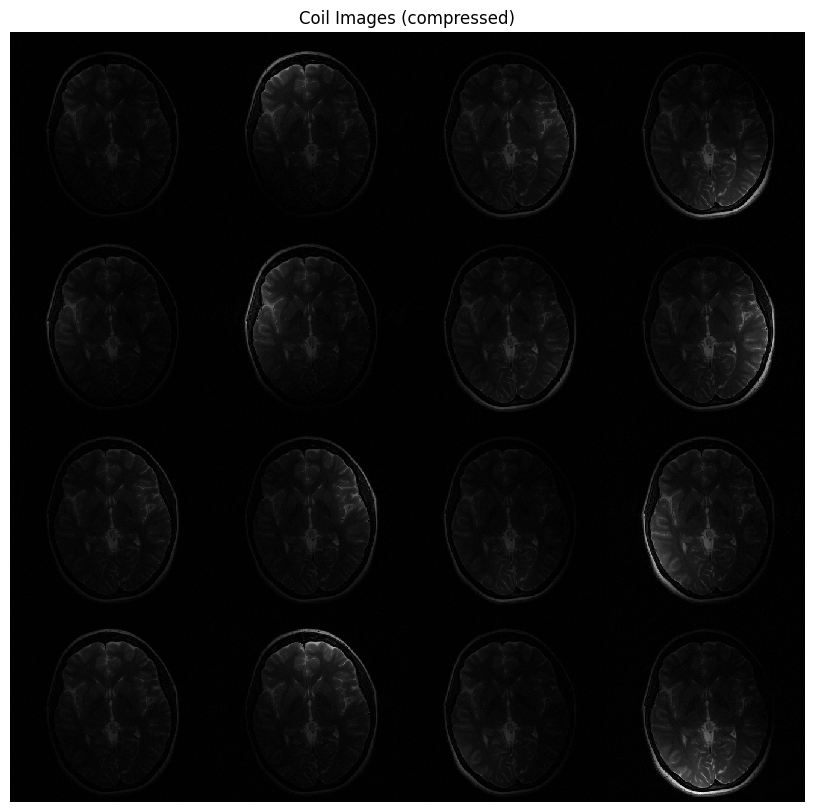

In [9]:
coil_img = ifft2c(kspace)
medutils.visualization.imshow(medutils.visualization.plot_array(medutils.visualization.center_crop(coil_img, (nFE//2, nPE))), title='Coil Images (compressed)', figsize=(20,10))

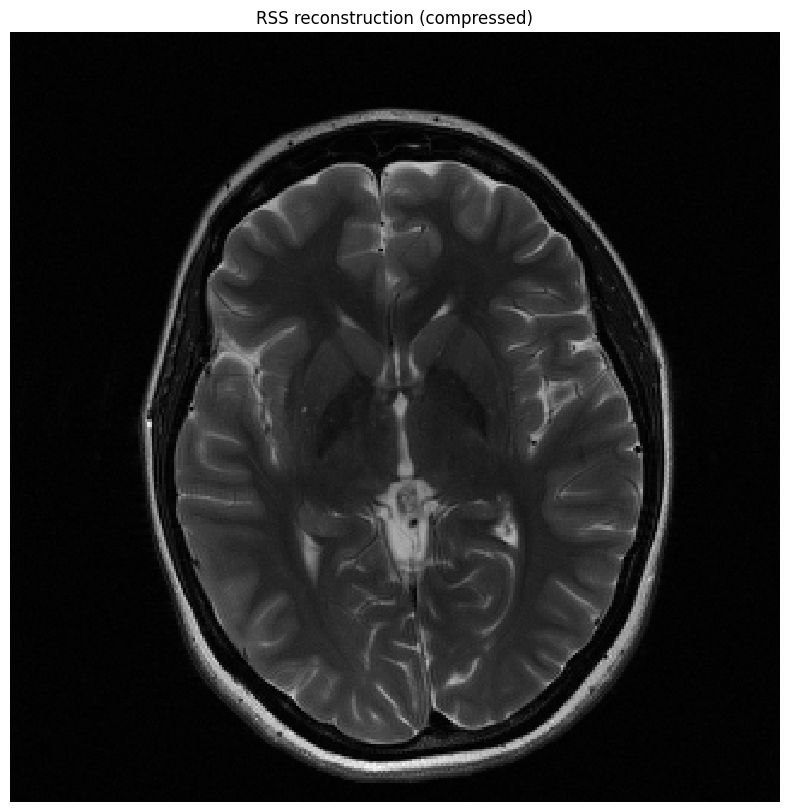

In [10]:
x_rss = rss(coil_img)
medutils.visualization.imshow(medutils.visualization.center_crop(x_rss, (320,320)), title='RSS reconstruction (compressed)', figsize=(10,10))

# Sensitivity Map Estimation

The coil sensitivity maps (`smaps`) are smooth maps that show us in which parts the single coil elements are sensitive. We will need these information for our multi-coil MRI forward and adjoint operators. We use the [python implementation](https://github.com/mikgroup/espirit-python) for ESPIRiT [4,5] to estimate these coil sensitivity maps.

[4] Uecker et al. [ESPIRiT—an eigenvalue approach to autocalibrating parallel MRI: Where SENSE meets GRAPPA](https://onlinelibrary.wiley.com/doi/10.1002/mrm.24751). Magn Reson Med 71(3):990-1001, 2014.

[5] https://github.com/mikgroup/espirit-python

In [11]:
import espirit
kspace_espirit = np.transpose(kspace, (1, 2, 0))[:,:,np.newaxis]
smaps_espirit = espirit.espirit(kspace_espirit, 8, 24, 0.05, 0)

smaps = smaps_espirit[:,:,0,:,0]
smaps = np.transpose(smaps, (2, 0, 1))

Let us visualize the coil sensitivity maps for our compressed k-space.

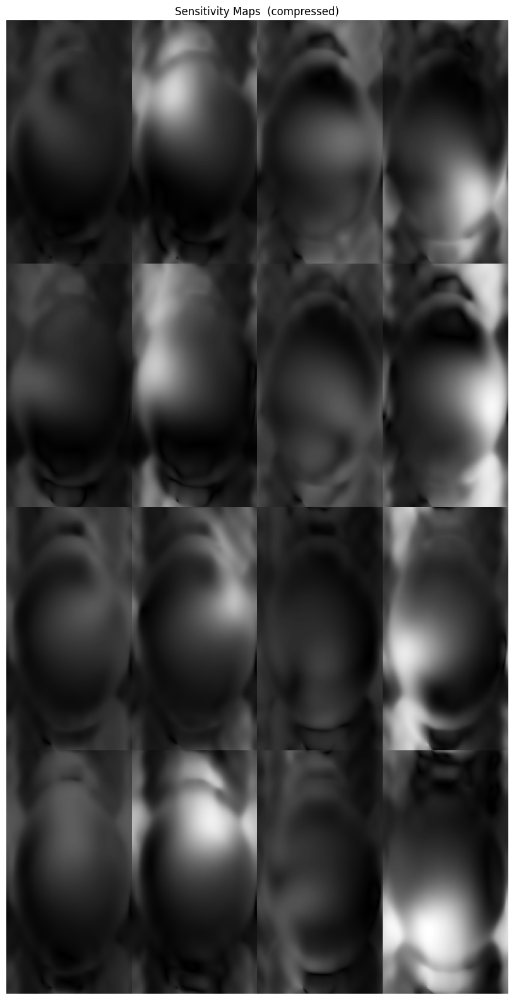

In [12]:
medutils.visualization.imshow(medutils.visualization.plot_array(smaps), title='Sensitivity Maps  (compressed)', figsize=(40,20))

# Multi-Coil Operators and Sensitivity-Weighted coil combination

Now, we have all ingredients to combine the image! Do you remember how the forward and adjoint MRI multi-coil operators are defined? These are required in the next steps.

**Task 4: Implement the multi-coil forward operator $A$ in `mriForwardOp(image, smaps, mask)` and adjoint operator $A^*$ in `mriAdjointOp(kspace, smaps, mask)`. Please check the lecture slides for details on the implementation.**

*Hint: Start with the implementation of the adjoint operator and make use of the previously written function `ifft2c`. Then, define a function `fft2c` which is the 2D centered Fourier transform before you continue with the forward operator.*

## Suggested Readings:

Pruessmann et al. [SENSE: Sensitivity encoding for fast MRI](https://onlinelibrary.wiley.com/doi/abs/10.1002/%28SICI%291522-2594%28199911%2942%3A5%3C952%3A%3AAID-MRM16%3E3.0.CO%3B2-S) Magnetic Resonance in Medicine, 43(5):952-962, 1999.


In [13]:
def mriAdjointOp(kspace, smaps, mask):
    # Step 1: Apply the mask to the k-space data
    masked_kspace = kspace * mask

    # Step 2: Transform k-space to image space using ifft2c
    img_space = ifft2c(masked_kspace)

    # Step 3: Multiply by the complex conjugate of the sensitivity maps
    adjoint_img = np.sum(img_space * np.conj(smaps), axis=0)

    return adjoint_img

def fft2c(image):
    # Step 1: Use np.fft.fftshift to shift zero-frequency components to the corners
    img_shifted = np.fft.fftshift(image, axes=(-2, -1))

    # Step 2: Apply np.fft.fft2 for the forward FFT with norm='ortho'
    kspace = np.fft.fft2(img_shifted, norm='ortho')

    # Step 3: Use np.fft.ifftshift to shift the result back to center
    kspace_shifted = np.fft.ifftshift(kspace, axes=(-2, -1))

    return kspace_shifted

def mriForwardOp(image, smaps, mask):
    # Step 1: Multiply the image by the sensitivity maps
    img_mult = image[np.newaxis, ...] * smaps

    # Step 2: Transform image space to k-space using fft2c
    kspace = fft2c(img_mult)

    # Step 3: Apply the mask to the k-space data
    masked_kspace = kspace * mask

    return masked_kspace


Now, you should check if the adjoint operator is working as expected. The result should be a coil-combined image. Right now, there is no undersampling mask involved, i.e., it is set to all ones.

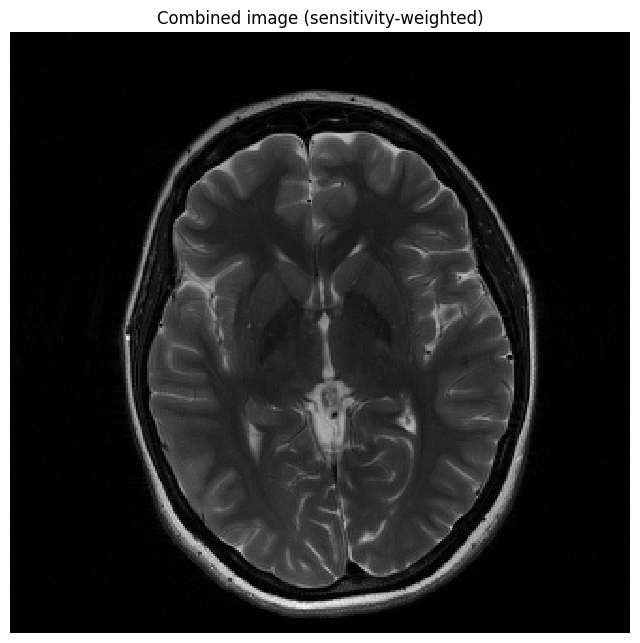

In [14]:
img_cc = mriAdjointOp(kspace, smaps, np.ones_like(kspace))
medutils.visualization.imshow(medutils.visualization.center_crop(img_cc, (nFE//2, nPE)), title='Combined image (sensitivity-weighted)', figsize=(8,8))

**Task 5: Adjointness check**

Now, also check if the operators are adjoint using following equation:
$$ \langle Au, v\rangle = \langle u, A^*v\rangle,$$
where $u$ and $v$ are complex random numbers. Think about which sizes $u$ and $v$ should have. Note, that the sampling mask and sensitivity maps are kept constant. To create random numbers, use `np.random.randn`. Print the results for the left-hand side and right-hand side of the equation.

*Hint: To get the correct result, you might use the `conj` when computing the complex-valued dot product.*

In [ ]:
# Define the mask as an array of ones with the same shape as kspace
mask = np.ones_like(kspace)

# Generate random complex numbers for u and v
u = np.random.randn(nFE, nPE) + 1j * np.random.randn(nFE, nPE)
v = np.random.randn(nCoils, nFE, nPE) + 1j * np.random.randn(nCoils, nFE, nPE)

# Compute the left-hand side of the adjointness equation
lhs = np.vdot(mriForwardOp(u, smaps, mask), v)

# Compute the right-hand side of the adjointness equation
rhs = np.vdot(u, mriAdjointOp(v, smaps, mask))

# Print the results for the left-hand side and right-hand side of the equation
print(f"Left-hand side: {lhs}")
print(f"Right-hand side: {rhs}")


Left-hand side: (-538.9394615098252-98.92775680673091j)
Right-hand side: (-538.9394615098224-98.92775680674993j)


# Undersampling
Now we will get to the most exciting part of this exercise - undersampling the k-space! We will generate undersampling masks for acceleration $R\in\lbrace 2,3\rbrace$.

**Task 5: Your task is to play around with different undersampling patterns. Generate a sampling pattern in the function `generate_mask(R, nPE, nFE, mode)` where `R` is the acceleration factor and `mode` is an integer corresponding to following patterns:**
1. Choose randomly an integer [0,1] with propability `p=[1/R, 1-1/R]`
2. Only set a dense block of `nRef=20` lines in the center of k-space.
3. Combine 1.+2.
4. Only set every `R`-th line
5. Combine 2.+4.

To create the mask, simply generate a 1D line of size `nPE`. For each item, compute and print the effective acceleration `Reff`, which is determined by `nPE` divided by the number of sampled points.

The code to get the full mask of size `[nFE, nPE]` is given below.

To continue the tasks on iterative reconstruction, please use `mode=3` and `R=3` as well as `mode=5` and `R=3`.

In [15]:
import numpy as np

def generate_mask(R, nPE, nFE, mode):
    mask = np.zeros(nPE)
    nRef = 20  # number of central lines for dense sampling

    if mode == 1:
        # Choose randomly an integer [0,1] with probability p=[1/R, 1-1/R]
        mask = np.random.rand(nPE) < 1.0 / R

    elif mode == 2:
        # Only set a dense block of nRef lines in the center of k-space
        center = nPE // 2
        mask[center - nRef // 2 : center + nRef // 2] = 1

    elif mode == 3:
        # Combine 1.+2.
        mask = np.random.rand(nPE) < 1.0 / R
        center = nPE // 2
        mask[center - nRef // 2 : center + nRef // 2] = 1

    elif mode == 4:
        # Only set every R-th line
        mask[::R] = 1

    elif mode == 5:
        # Combine 2.+4.
        mask[::R] = 1
        center = nPE // 2
        mask[center - nRef // 2 : center + nRef // 2] = 1

    # Reshape mask to [nFE, nPE]
    mask = mask.reshape(1, nPE).repeat(nFE, axis=0)

    # Compute and print the effective acceleration Reff
    Reff = nPE / np.sum(mask[0, :])
    print(f"Effective acceleration Reff: {Reff}")

    return mask

Now, generate the mask and visualize it (we visualize only a fraction in frequency encoding direction).

Effective acceleration Reff: 2.682926829268293


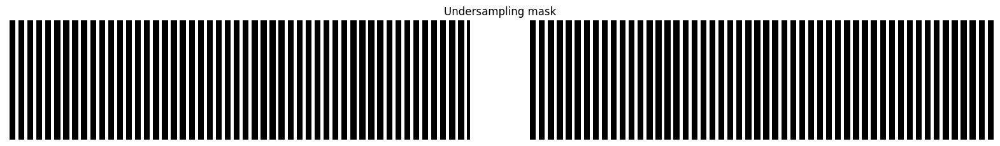

In [16]:
np.random.seed(1001)
mask = generate_mask(R=3, nPE=nPE, nFE=nFE, mode=5)

medutils.visualization.imshow(mask[:40,:], 'Undersampling mask', figsize=(20,20))

Effective acceleration Reff: 2.8205128205128207


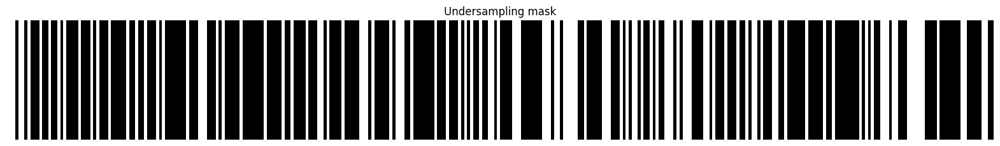

In [22]:
np.random.seed(1001)
mask2 = generate_mask(R=3, nPE=nPE, nFE=nFE, mode=1)

medutils.visualization.imshow(mask2[:40,:], 'Undersampling mask', figsize=(20,20))

Effective acceleration Reff: 6.470588235294118


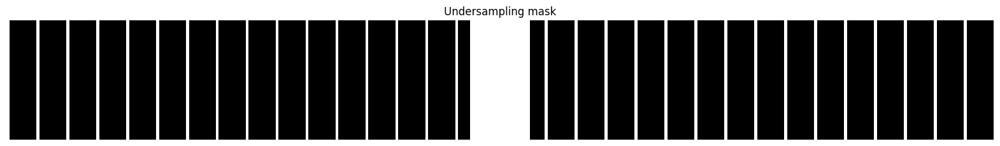

In [24]:
np.random.seed(1001)
mask3 = generate_mask(R=10, nPE=nPE, nFE=nFE, mode=5)

medutils.visualization.imshow(mask3[:40,:], 'Undersampling mask', figsize=(20,20))

**Task 6: Zero-Filling solution**

Now you are ready to estimate the zero filling solution by applying the adjoint operator to the data, by using the estimated undersampling mask `mask`. Play around with above mask configurations. How do the images change?

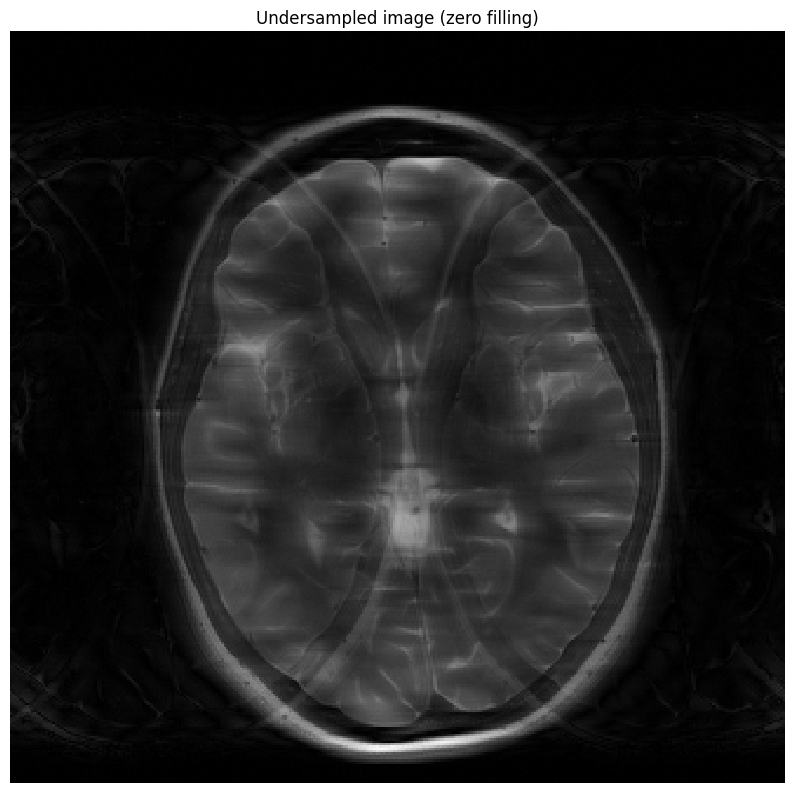

In [17]:
# Apply the adjoint operator to the data and use the newly created undersampling mask
img_cc_us = mriAdjointOp(kspace, smaps, mask)

# Center crop the resulting image
img_cc_us = medutils.visualization.center_crop(img_cc_us, (nFE//2, nPE))

# Visualize the undersampled image (zero filling)
medutils.visualization.imshow(img_cc_us, 'Undersampled image (zero filling)', figsize=(10,10))


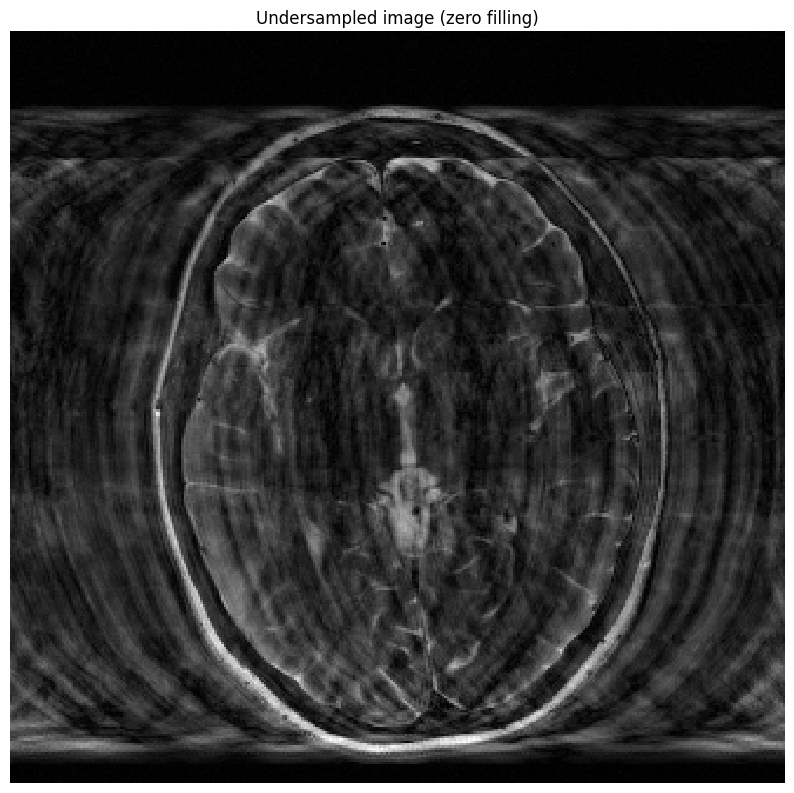

In [25]:
# Apply the adjoint operator to the data and use the newly created undersampling mask
img_cc_us = mriAdjointOp(kspace, smaps, mask2)

# Center crop the resulting image
img_cc_us = medutils.visualization.center_crop(img_cc_us, (nFE//2, nPE))

# Visualize the undersampled image (zero filling)
medutils.visualization.imshow(img_cc_us, 'Undersampled image (zero filling)', figsize=(10,10))


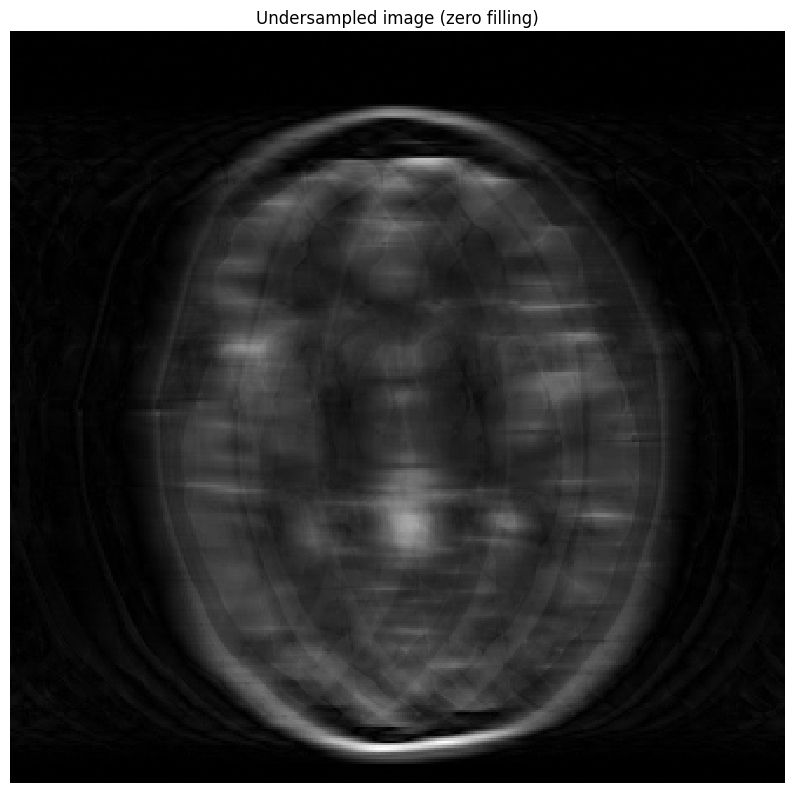

In [26]:
# Apply the adjoint operator to the data and use the newly created undersampling mask
img_cc_us = mriAdjointOp(kspace, smaps, mask3)

# Center crop the resulting image
img_cc_us = medutils.visualization.center_crop(img_cc_us, (nFE//2, nPE))

# Visualize the undersampled image (zero filling)
medutils.visualization.imshow(img_cc_us, 'Undersampled image (zero filling)', figsize=(10,10))


# Linear and Regularized Reconstruction
Now, we are ready to implement linear and regularized reconstruction. We additionally need the gradient operator, implementing forward / backward differences in `D` and `DT`, and the multi-coil MRI forward and adjoint operators, `A` and `AH`, respectively.

In [27]:
def nabla(x):
    dx = np.pad(x[:,1:], [[0, 0],[0, 1]], mode='edge')
    dy = np.pad(x[1:], [[0, 1],[0, 0]], mode='edge')
    return np.concatenate([dx[None,...] - x, dy[None,...] - x], 0)

def nablaT(x):
    assert x.shape[0] == 2
    dx = np.pad(x[0,:,:-1], [[0, 0],[1, 0]], mode='constant')
    dy = np.pad(x[1,:-1], [[1, 0],[0, 0]], mode='constant')
    return dx - x[0] + dy - x[1]

D = lambda x: nabla(np.real(x)) + 1j * nabla(np.imag(x))
DT= lambda x: nablaT(np.real(x)) + 1j * nablaT(np.imag(x))

In [28]:
A = lambda x: mriForwardOp(x, smaps, mask)
AH = lambda x: mriAdjointOp(x, smaps, mask)

## Solving the linear reconstruction problem
Consider the following minimization problem:

$$ \min_x  E(x,y) = \min_x \frac{1}{2} \Vert Ax - y \Vert_2^2 .$$

While in image denoising we are still able to compute a closed-form solution for this problem, this is not feasible for the task of MRI reconstruction anymore. We instead use first-order optimization methods and solve this by Gradient Descent:
$$ x^{t+1} = x^{t} - \alpha \nabla_x E(x,y) $$
in our case, $\nabla_x E(x,y)$ is $A^* (Ax^t - y)$, so that our iterative steps are
$$ x^{t+1} = x^{t} - \alpha A^* (Ax^t - y) $$

**Task 6: Implement Gradient Descent in `opt_linear` to solve the linear reconstruction problem and run the optimization for `max_iter=50` iterations and a step size of `alpha=1`**

In [29]:
def opt_linear(y, max_iter, alpha):
    x = np.zeros_like(AH(y))

    for i in range(max_iter):
        gradient = AH(A(x) - y)
        x = x - alpha * gradient

    return x

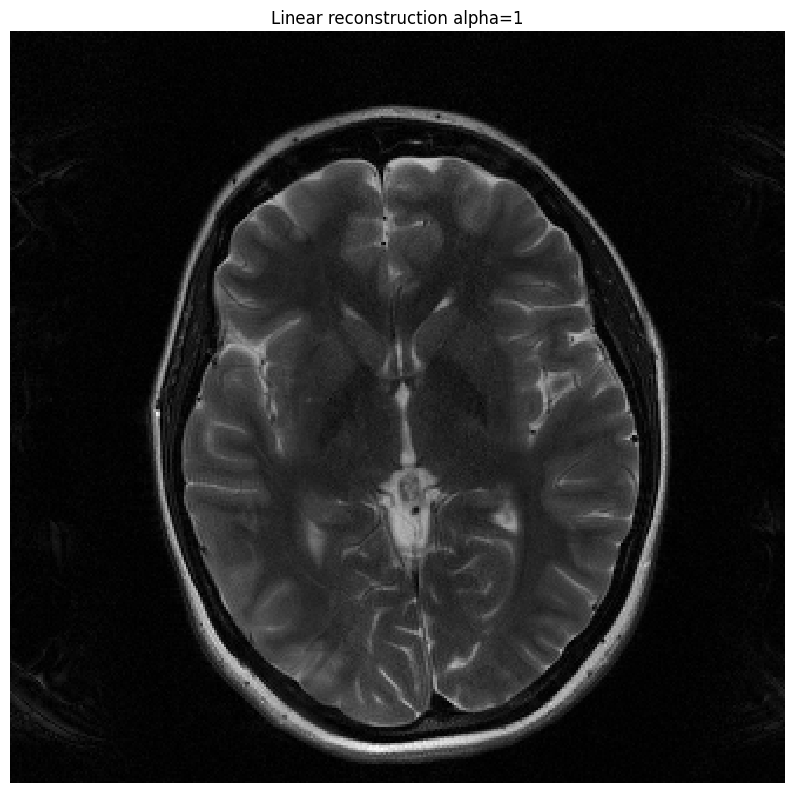

In [30]:
alpha=1
img_linear = opt_linear(kspace, max_iter=50, alpha=alpha)
img_linear = medutils.visualization.center_crop(img_linear, (nFE//2, nPE))
medutils.visualization.imshow(img_linear, f'Linear reconstruction alpha={alpha}', figsize=(10,10))

## L2-H1 Regularization

Now, we regularize the least-squares problem with a regularizer of form $\mathcal{R}(x)=\frac{1}{2} \Vert \nabla x \Vert_2^2$.
Consider now the following minimization problem

$$ \min_x  D(x,y) + \lambda R(x) = \min_x \frac{1}{2}\Vert Ax - y \Vert_2^2 + \frac{\lambda}{2}\Vert \nabla x \Vert_2^2.$$

We solve this by Gradient Descent:
$$ x^{t+1} = x^{t} - \alpha \left( \nabla_x D(x,y) + \nabla_x R(x) \right) $$
which in our case is
$$ x^{t+1} = x^{t} - \alpha \left( A^H (Ax^t - y) + \lambda \nabla^T \nabla x \right) $$

**Task 7: Implement gradient descent to solve the L2-H1 regularized problem and run the optimization for `max_iter=200` iterations, a step size of `alpha=1.0` and a regularization parameter of `lambd=0.01`.**

*Note that we do not have the best setting for the parameters here and the difference to the linear reconstruction might be only minimal. You can play around with the hyper-parameters. This example is to show you the properties of L2-H1 regularization and that it is actually hard to find a good set of hyper-parameters (step size, regularization parameters, iterations).*

In [31]:
def opt_reg_l2(y, max_iter, alpha, lambd):
    x = np.zeros_like(AH(y))

    for i in range(max_iter):
        # Compute the gradient of the data fidelity term
        grad_data_fidelity = AH(A(x) - y)
        grad_reg = DT(D(x))
        gradient = grad_data_fidelity + lambd * grad_reg
        x = x - alpha * gradient

    return x

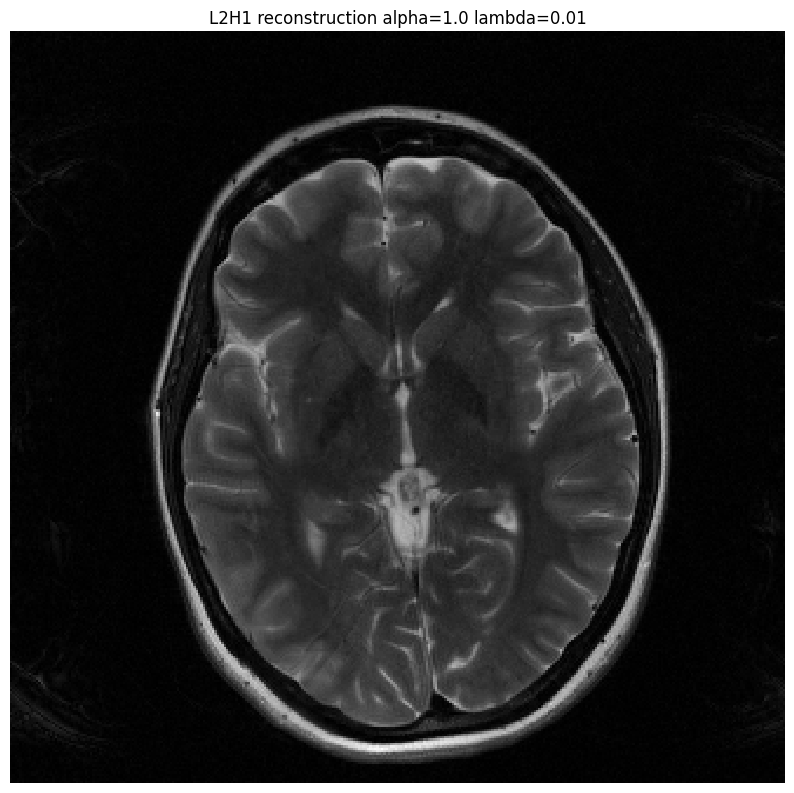

In [32]:
alpha = 1.0
lambd = 0.01
img_reg_l2 = opt_reg_l2(kspace, max_iter=200, alpha=alpha, lambd=lambd)
img_reg_l2 = medutils.visualization.center_crop(img_reg_l2, (nFE//2, nPE))
medutils.visualization.imshow(img_reg_l2, f'L2H1 reconstruction alpha={alpha} lambda={lambd}', figsize=(10,10))

## Sparse MRI: Wavelet Thresholding
Medical images per se are not sparse, however, they might have a sparse representation in some transform domain. One example here is the Wavelet transform, resulting in a multi-level feature representation. We provide the `plot_wavedec` function to find out how the sparse images look like at different scales and orientations.

Now, we regularize the least-squares problem with a wavelet sparse regularizer of form $\mathcal{R}(x)=\frac{1}{2} \Vert W x \Vert_2^2$.
Consider now the following minimization problem

$$ \min_x  D(x,y) + \lambda R(x) = \min_x \frac{1}{2}\Vert Ax - y \Vert_2^2 + \frac{\lambda}{2}\Vert W x \Vert_2^2.$$
where W is the wavelet transform.
We solve this by proximal gradient:
$$ x^{t+1} = x^{t} - \alpha \left( A^H (Ax^t - y) + \lambda \text{Prox}_W(x) \right) $$
where $\text{Prox}_W$ is the proximal operator regarding to W. In this case,
$$\text{Prox}_W=W^T\text{thresh}(Wx)$$,
in which the *detailed* Wavelet coefficients are surpressed by using soft-thresholding, i.e.,

$$
\text{thresh}(x) = \frac{x}{\vert x \vert}\max(\vert x \vert - \alpha\lambda , 0)
$$

**Task 8: Implement the soft-thresholding in `soft_thresh(x, tau)`**

*Hint: Note, that the absolut value could get zero, and a small epsilon might be adorable to surpress this.*

### Suggested Readings

Lustig et al. [Compressed Sensing MRI](https://ieeexplore.ieee.org/document/4472246), IEEE Signal Processing Magazine 25(2):72-82, 2008.

Lustig et al. [Sparse MRI: The application of compressed sensing for rapid MR imaging](https://onlinelibrary.wiley.com/doi/full/10.1002/mrm.21391). Magnetic Resonance in Medicine 58(6):1182-1195, 2007.

In [33]:
def soft_thresh(x, tau):
    # Apply soft-thresholding
    return np.sign(x) * np.maximum(np.abs(x) - tau, 0)


Now we can use your `soft_thresh` function and Wavelet toolkit provided by `pywt` for iteration steps.

**Task 9: Apply the soft-thresholding to the Wavelet coefficients**

*Hint: look back to the $\text{Prox}_W$ equation*, quite easy, right?

In [34]:
import pywt

def plot_wavedec(img, wavelet='db4', level=2):
    img = medutils.visualization.center_crop(img, (nFE//2, nPE))
    coeffs = pywt.wavedecn(img, wavelet=wavelet, level=level)
    # normalize coeffs
    coeffs[0] /= np.max(np.abs(coeffs[0]))
    for level in range(1, len(coeffs)):
        for key in coeffs[level].keys():
            coeffs[level][key] /= np.max(np.abs(coeffs[level][key]))
    arr, coeff_slices = pywt.coeffs_to_array(coeffs)
    medutils.visualization.imshow(arr, figsize=(10,10))

def opt_reg_wavelet(y, max_iter, alpha, lambd, wavelet='db4', level=3):
    x = np.zeros_like(AH(y))
    wavelet_object = pywt.Wavelet(wavelet)
    threshold = alpha * lambd

    for _ in range(max_iter):
        x = x - alpha * (AH(A(x) - y))
        coeffs = pywt.wavedecn(x, wavelet_object, level=level)
        # The wavelet coefficients Wx are stored in an array.
        array, coeff_slices = pywt.coeffs_to_array(coeffs)

        # Apply soft-thresholding to the wavelet coefficients (array) with pre-defined threshold
        denoised_array = soft_thresh(array, threshold)

        # Apply W^T to the thresholded coefficients
        denoised_coeffs = pywt.array_to_coeffs(denoised_array, coeff_slices, output_format='wavedecn')
        denoised_coeffs[0] = coeffs[0]
        x = pywt.waverecn(denoised_coeffs, wavelet_object)

    return x

Next, we define a wavelet, the number of levels for decomposition and plot the decomposition.

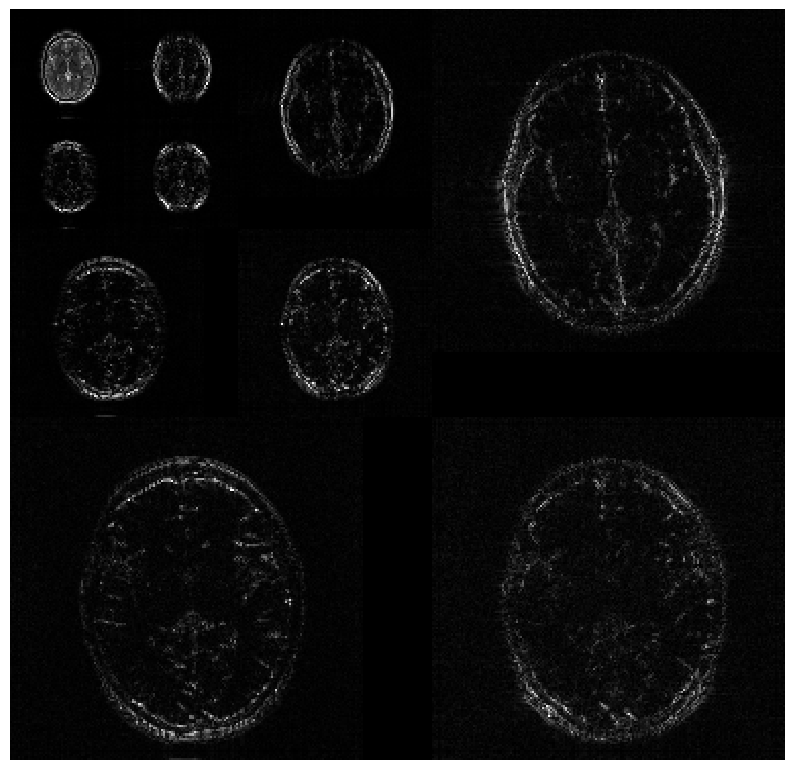

In [35]:
# Plot Wavelet Decomposition
wavelet='bior2.8'
level=3
plot_wavedec(img_cc, wavelet, level)

Finally, we run the optimization for `lambd=1e-6` and `alpha=1` and 200 iterations.

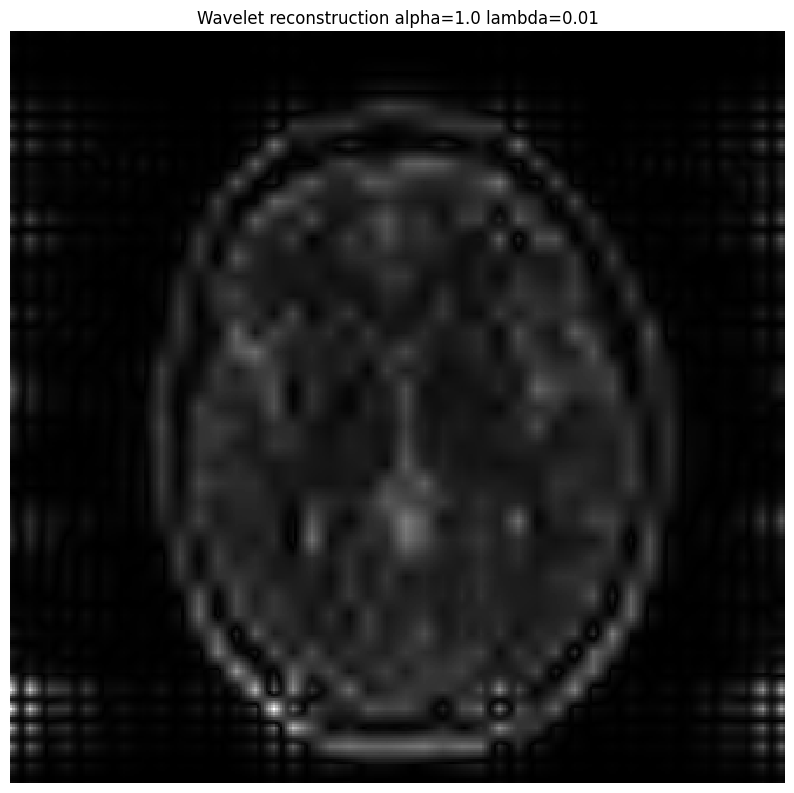

In [37]:
lambd=0.01
alpha=1.0
img_reg_wavelet = opt_reg_wavelet(kspace, max_iter=200, alpha=alpha, lambd=lambd, wavelet=wavelet, level=level)
img_reg_wavelet = medutils.visualization.center_crop(img_reg_wavelet, (nFE//2, nPE))
medutils.visualization.imshow(img_reg_wavelet, f'Wavelet reconstruction alpha={alpha} lambda={lambd}', figsize=(10,10))

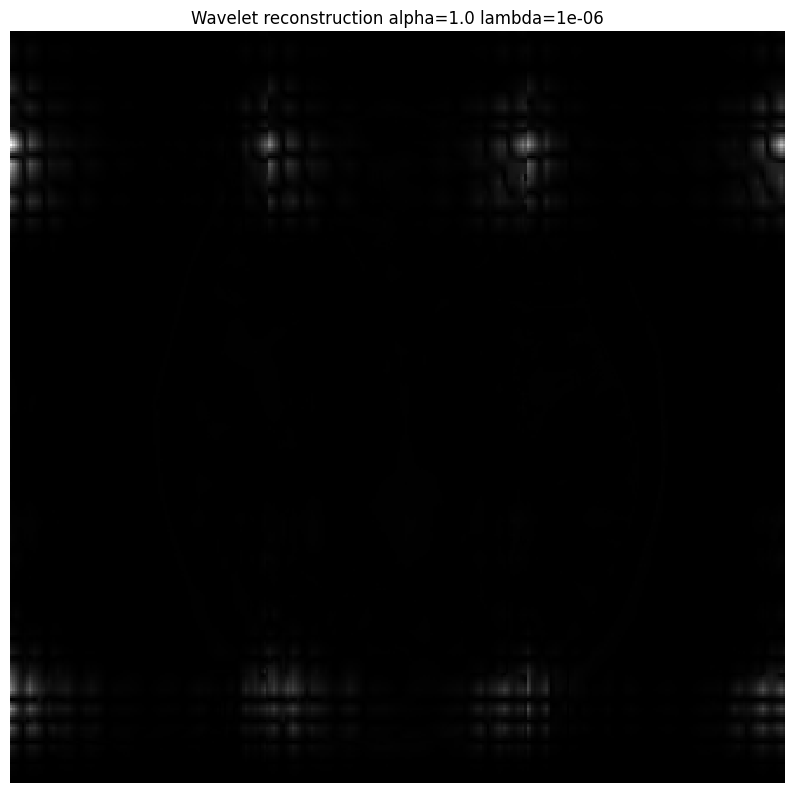

In [36]:
lambd=1e-6
alpha=1.0
img_reg_wavelet = opt_reg_wavelet(kspace, max_iter=200, alpha=alpha, lambd=lambd, wavelet=wavelet, level=level)
img_reg_wavelet = medutils.visualization.center_crop(img_reg_wavelet, (nFE//2, nPE))
medutils.visualization.imshow(img_reg_wavelet, f'Wavelet reconstruction alpha={alpha} lambda={lambd}', figsize=(10,10))